**PHƯƠNG PHÁP: PHÂN CỤM  (Clustering)**

# 1. Thiết lập môi trường và tải dữ liệu




## Cài đặt thư viện cần thiết

In [ ]:
install.packages("pacman")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
pacman :: p_load(pacman, stats, dplyr, ggplot2, ggExtra, GGally,corrplot, RColorBrewer, psych,graphics,lattice,caret,
                 tidyr, fpc, data.table, DT, gridExtra,purrr, plotly, caret,cluster,RPMG, dendextend, dbscan)


options(warn=-1)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘colourpicker’, ‘shinyjs’



ggExtra installed

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘patchwork’, ‘ggstats’, ‘plyr’



GGally installed

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


corrplot installed

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘mnormt’, ‘GPArotation’



psych installed

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘listenv’, ‘parallelly’, ‘future’, ‘globals’, ‘shape’, ‘future.apply’, ‘numDeriv’, ‘progressr’, ‘SQUAREM’, ‘diagram’, ‘lava’, ‘prodlim’, ‘proxy’, ‘iterators’, ‘clock’, ‘gower’, ‘hardhat’, ‘ipred’, ‘sparsevctrs’, ‘timeDate’, ‘e1071’, ‘foreach’, ‘ModelMetrics’, ‘pROC’, ‘recipes’, ‘reshape2

In [ ]:
install.packages("ISLR")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
rm(list = ls())     # clear the workspace
library(ISLR)       # load ISLR data package
library(tidyverse)
library(ggplot2)
library(e1071)   #library needed to use Naive Bayes algorithm, svm algorithm
library(rpart)   #Decision Tree
library(rpart.plot)
library(randomForest)

library(pROC) #ROC curve for analysis

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.4     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


ERROR: Error in library(e1071): there is no package called ‘e1071’


## Tải và đọc dữ liệu

In [ ]:
# Read data
data <- read.table("marketing_campaign.csv", sep = "\t", header = T)

# Nr. of instances
cat("Number of instances:", nrow(data))

# View data
head(data, 10)

Number of instances: 2240

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,⋯,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,⋯,7,0,0,0,0,0,0,3,11,1
2,2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,⋯,5,0,0,0,0,0,0,3,11,0
3,4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,⋯,4,0,0,0,0,0,0,3,11,0
4,6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,⋯,6,0,0,0,0,0,0,3,11,0
5,5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,⋯,5,0,0,0,0,0,0,3,11,0
6,7446,1967,Master,Together,62513,0,1,09-09-2013,16,520,⋯,6,0,0,0,0,0,0,3,11,0
7,965,1971,Graduation,Divorced,55635,0,1,13-11-2012,34,235,⋯,6,0,0,0,0,0,0,3,11,0
8,6177,1985,PhD,Married,33454,1,0,08-05-2013,32,76,⋯,8,0,0,0,0,0,0,3,11,0
9,4855,1974,PhD,Together,30351,1,0,06-06-2013,19,14,⋯,9,0,0,0,0,0,0,3,11,1


# 2. Chuẩn bị và khám phá dữ liệu

### Làm sạch dữ liệu

In [ ]:
# Inspect data
check <- function(data) {
  l <- list()
  columns <- names(data)
  for (col in columns) {
    instances <- sum(!is.na(data[[col]]))
    dtypes <- class(data[[col]])
    unique <- length(unique(data[[col]]))
    sum_null <- sum(is.na(data[[col]]))
    duplicates <- sum(duplicated(data))
    l[[length(l) + 1]] <- c(col, dtypes, instances, unique, sum_null, duplicates)
  }
  data_check <- as.data.frame(do.call(rbind, l))
  names(data_check) <- c("column", "dtype", "instances", "unique", "sum_null", "duplicates")
  return(data_check)
}

check(data)

column,dtype,instances,unique,sum_null,duplicates
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ID,integer,2240,2240,0,0
Year_Birth,integer,2240,59,0,0
Education,character,2240,5,0,0
Marital_Status,character,2240,8,0,0
Income,integer,2216,1975,24,0
Kidhome,integer,2240,3,0,0
Teenhome,integer,2240,3,0,0
Dt_Customer,character,2240,663,0,0
Recency,integer,2240,100,0,0


In [ ]:
# Remove the NA Values
data <- na.omit(data)
cat("The total number of instances after removing the rows with missing values is:", nrow(data))

The total number of instances after removing the rows with missing values is: 2216

### Feature Engineering

In [ ]:
# Tenure
data$Dt_Customer <- as.Date(data$Dt_Customer, format= "%d-%m-%Y")
days <- as.numeric(max(data$Dt_Customer) - data$Dt_Customer)
data$Tenure <- days
data$Tenure <- as.numeric(data$Tenure, errors="coerce")

# Age
data$Age <- 2023 - data$Year_Birth

# Spendings
data$Spendings <- data$MntWines + data$MntFruits + data$MntMeatProducts + data$MntFishProducts + data$MntSweetProducts + data$MntGoldProds

    # Wines
    data$Wines <- data$MntWines

    # Fruits
    data$Fruits <- data$MntFruits

    # Meat
    data$Meat <- data$MntMeatProducts

    # Fish
    data$Fish <- data$MntFishProducts

    # Sweets
    data$Sweets <- data$MntSweetProducts

    # Gold
    data$Gold <- data$MntGoldProds

# Relatioship Status
data$RelationshipStatus <- ifelse(data$Marital_Status == "Married" | data$Marital_Status == "Together", "Partner",
ifelse(data$Marital_Status %in% c("Absurd", "Widow", "YOLO", "Divorced", "Single"), "Alone", ""))

data$RelStatus <- ifelse(data$RelationshipStatus == "Partner", 2, 1)


# Children
data$Children <- data$Kidhome + data$Teenhome

# Parent
data$Parent <- ifelse(data$Children > 0, 1, 0)

# Education
data$Education <- ifelse(data$Education %in% c("Basic", "2n Cycle"), "Undergraduate",
                         ifelse(data$Education == "Graduation", "Graduate",
                                ifelse(data$Education %in% c("Master", "PhD"), "Postgraduate", "")))

data$LevEd <- as.numeric(ifelse(data$Education == "Undergraduate",1,
                             ifelse(data$Education == "Graduate", 2,
                                ifelse(data$Education == "Postgraduate", 3, 0))))

# Campaign
data$Campaign <- data$AcceptedCmp1 + data$AcceptedCmp2 + data$AcceptedCmp3 + data$AcceptedCmp4 + data$AcceptedCmp5

# Purchases
data$Purchases <- data$NumDealsPurchases + data$NumWebPurchases + data$NumCatalogPurchases + data$NumStorePurchases



In [ ]:
# Change names of different variables for simplicity
data$WebVisits <- data$NumWebVisitsMonth
data$Web <- data$NumWebPurchases
data$Deal<- data$NumDealsPurchases
data$Catalog <- data$NumCatalogPurchases
data$Store <- data$NumStorePurchases

In [ ]:
to_drop <- c("Marital_Status", "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth", "Dt_Customer","MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds","AcceptedCmp1","AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5","Z_CostContact", "Z_Revenue", "Year_Birth", "ID","Teenhome","Kidhome")
ds <- data[, !(names(data) %in% to_drop)]
# check(ds)

### Mô tả trực quan dữ liệu

In [ ]:
# Generating a summary of all data attributes
describe(ds)
# summary(ds)
do.call(cbind, lapply(ds, summary))

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Education*,1,2216,1.611011e+00,6.834686e-01,1.0,1.514092e+00,0.0000,1,3,2,0.672627247,-0.6830960,1.451890e-02
Income,2,2216,5.224725e+04,2.517308e+04,51381.5,5.176399e+04,24548.1495,1730,666666,664936,6.754333782,159.1276059,5.347508e+02
Recency,3,2216,4.901264e+01,2.894835e+01,49.0,4.899267e+01,37.0650,0,99,99,0.001645477,-1.2014022,6.149488e-01
Complain,4,2216,9.476534e-03,9.690700e-02,0.0,0.000000e+00,0.0000,0,1,1,10.119023205,100.4399561,2.058592e-03
Response,5,2216,1.502708e-01,3.574173e-01,0.0,6.313416e-02,0.0000,0,1,1,1.956096983,1.8271405,7.592602e-03
Tenure,6,2216,3.535212e+02,2.024347e+02,355.5,3.538811e+02,258.7137,0,699,699,-0.016899257,-1.2014275,4.300312e+00
Age,7,2216,5.417960e+01,1.198555e+01,53.0,5.404510e+01,13.3434,27,130,103,0.353182830,0.7269415,2.546087e-01
Spendings,8,2216,6.070754e+02,6.029005e+02,396.5,5.276150e+02,524.0991,5,2525,2520,0.856893520,-0.3508523,1.280739e+01
Wines,9,2216,3.050916e+02,3.373279e+02,174.5,2.502751e+02,245.3703,0,1493,1493,1.169135662,0.5754916,7.165845e+00


,Education,Income,Recency,Complain,Response,Tenure,Age,Spendings,Wines,Fruits,⋯,Children,Parent,LevEd,Campaign,Purchases,WebVisits,Web,Deal,Catalog,Store
Min.,2216,1730,0,0,0,0,27,5,0,0,⋯,0,0,1,0,0,0,0,0,0,0
1st Qu.,character,35303,24,0,0,180,46,69,24,2,⋯,0,0,2,0,8,3,2,1,0,3
Median,character,51381.5,49,0,0,355.5,53,396.5,174.5,8,⋯,1,1,2,0,15,6,4,2,2,5
Mean,2216,52247.2513537906,49.0126353790614,0.00947653429602888,0.150270758122744,353.521209386282,54.1796028880866,607.07536101083,305.091606498195,26.3560469314079,⋯,0.947202166064982,0.714350180505415,2.26714801444043,0.298285198555957,14.8808664259928,5.31904332129964,4.08528880866426,2.3235559566787,2.67102888086643,5.80099277978339
3rd Qu.,character,68522,74,0,0,529,64,1048,505,33,⋯,1,1,3,0,21,7,6,3,4,8
Max.,character,666666,99,1,1,699,130,2525,1493,199,⋯,3,1,3,4,44,20,27,15,28,13


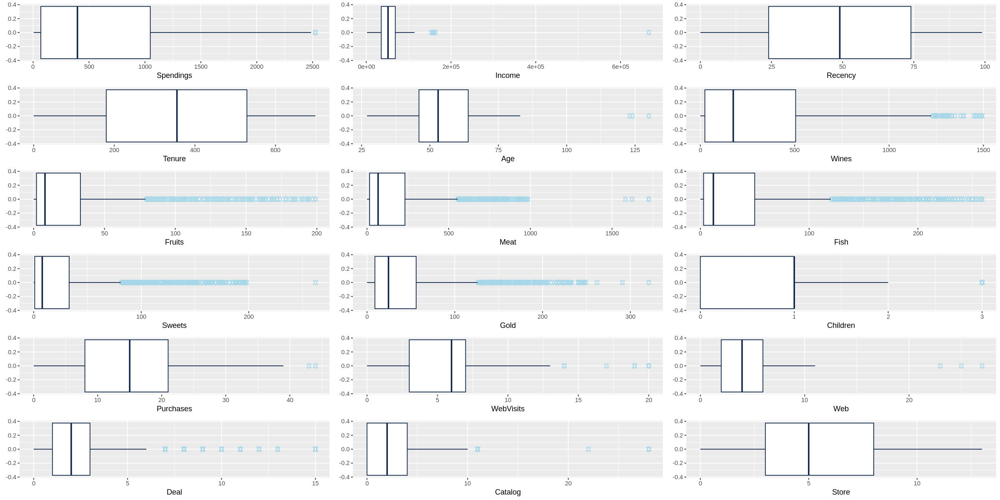

In [ ]:
options(repr.plot.width=20, repr.plot.height=10)
plots <- list()
variables <- c("Spendings", "Income", "Recency", "Tenure", "Age", "Wines", "Fruits", "Meat", "Fish", "Sweets", "Gold", "Children", "Purchases", "WebVisits", "Web", "Deal", "Catalog", "Store")

for (var in variables) {
  plot <- ggplot(ds, aes_string(x = var, fill = var)) +
    geom_boxplot(outlier.colour = "#A5D7E8", outlier.shape = 11, outlier.size = 2, col = "#0B2447", notch = F)
  plots[[var]] <- plot
}

grid.arrange(grobs = plots, ncol = 3)

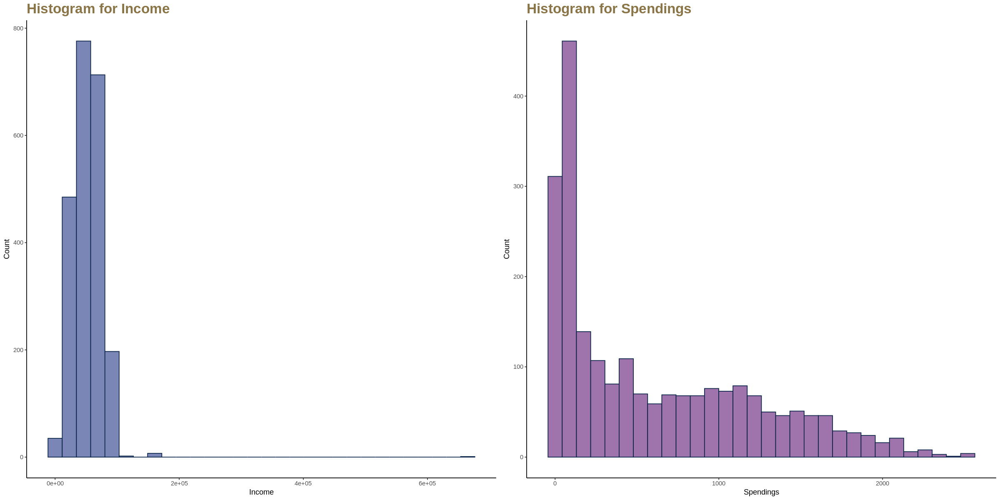

In [ ]:
options(repr.plot.width=20, repr.plot.height=10)
require(gridExtra)

plot1 <- ggcorr(ds, method = c("pairwise", "pearson"),hjust = 0.75, size = 3.5, color = "#302e2e", layout.exp = 1, geom = "tile", low = "steelblue", mid = "white", high = "darkred", label = TRUE, label_size = 3, label_color = "#302e2e", label_alpha = TRUE)

Income_hist <- ggplot(ds, aes(x = Income)) +
  geom_histogram(color = '#0B2447', fill ='#7A86B6', bins=30) +
  labs(
    title = "Histogram for Income",
#     caption = "Source: Gapminder dataset",
    x = "Income",
    y = "Count"
  ) +
  theme_classic() +
  theme(
    plot.title = element_text(color = "#8A7546", size = 20, face = "bold"),
    plot.subtitle = element_text(color = "#D6B978",size = 12, face = "bold"),
    plot.caption = element_text(face = "italic"))

Spendings_hist <- ggplot(ds, aes(x = Spendings)) +
  geom_histogram(color = '#0B2447', fill ='#9F73AB', bins=30) +
  labs(
    title = "Histogram for Spendings",
#     caption = "Source: Gapminder dataset",
    x = "Spendings",
    y = "Count"
  ) +
  theme_classic() +
  theme(
    plot.title = element_text(color = "#8A7546", size = 20, face = "bold"),
    plot.subtitle = element_text(color = "#D6B978",size = 12, face = "bold"),
    plot.caption = element_text(face = "italic"))

grid.arrange(Income_hist, Spendings_hist, ncol=2)

In [ ]:
describe(ds$Income)
summary(ds$Income)

IQR_Income <- 68522 - 35303
upfen_Income <- 68522 + 1.5*IQR_Income
cat("\n","The upper fence for Income column would be:",upfen_Income)


describe(ds$Spendings)
summary(ds$Spendings)

IQR_Spendings <- 1048 - 69
upfen_Spendings <- 1048 + 1.5*IQR_Spendings
cat("\n","The upper fence for Spendings column would be:",upfen_Spendings)

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,2216,52247.25,25173.08,51381.5,51763.99,24548.15,1730,666666,664936,6.754334,159.1276,534.7508


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1730   35303   51382   52247   68522  666666 


 The upper fence for Income column would be: 118350.5

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,2216,607.0754,602.9005,396.5,527.615,524.0991,5,2525,2520,0.8568935,-0.3508523,12.80739


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    5.0    69.0   396.5   607.1  1048.0  2525.0 


 The upper fence for Spendings column would be: 2516.5

In [ ]:
ds <- subset(ds, Income <= 118350.5 & Spendings <= 2516.5)
# check(ds)
cat("The total number of instances after removing the rows with outliers in Income & Spendings columns is:", nrow(ds), "\n")

The total number of instances after removing the rows with outliers in Income & Spendings columns is: 2205 


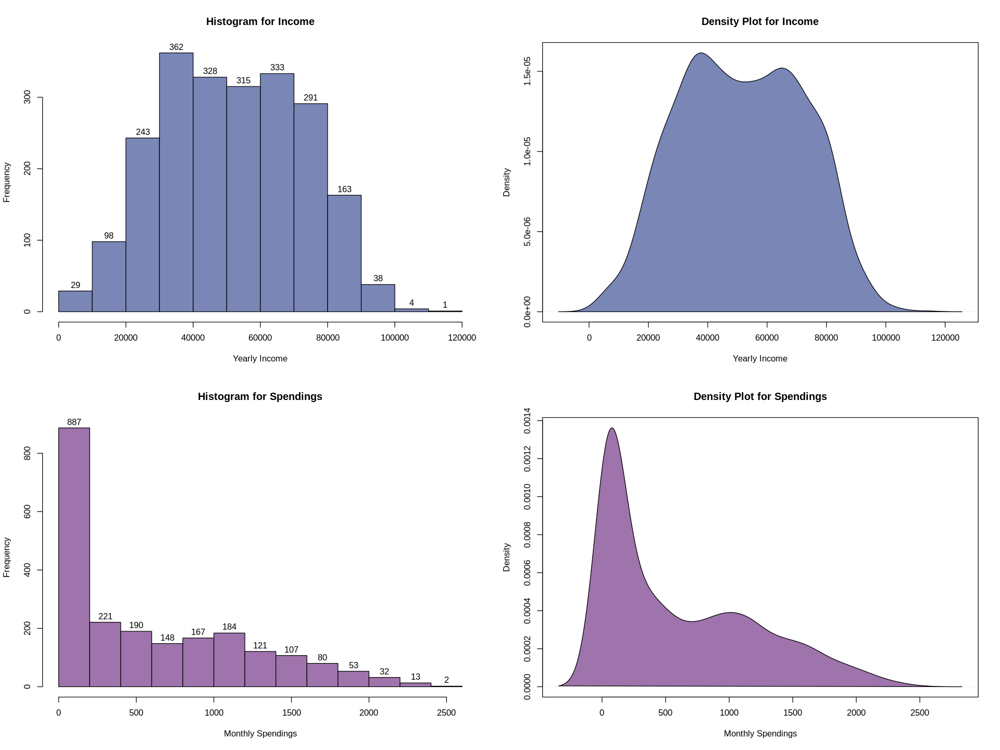

In [ ]:
options(repr.plot.width=16, repr.plot.height=12)
par(mfrow = c(2, 2))

Income_hist <- hist(ds$Income,
  col="#7A86B6",
  main="Histogram for Income",
  xlab="Yearly Income",
  ylab="Frequency",
  labels=TRUE)

 Income_density <- plot(density(ds$Income),
    col="#7A86B6",
    main="Density Plot for Income",
    xlab="Yearly Income",
    ylab="Density")
polygon(density(ds$Income),
        col="#7A86B6")

Spendings_hist <- hist(ds$Spendings,
  col="#9F73AB",
  main="Histogram for Spendings",
  xlab="Monthly Spendings",
  ylab="Frequency",
  labels=TRUE)

 Spendings_density <- plot(density(ds$Spendings),
    col="#9F73AB",
    main="Density Plot for Spendings",
    xlab="Monthly Spendings",
    ylab="Density")
polygon(density(ds$Spendings),
        col="#9F73AB")


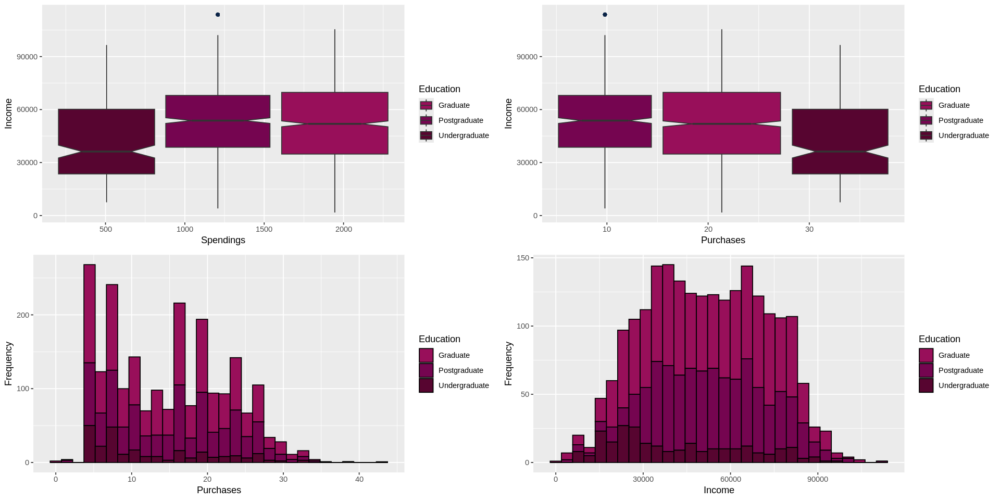

In [ ]:
options(repr.plot.width=16, repr.plot.height=8)
require(gridExtra)

income_spendings_education_plot <- ggplot(ds, aes(x=Spendings,y=Income,fill=Education)) +
geom_boxplot(outlier.colour="#0B2447", outlier.shape=16,outlier.size=2, notch=T) +
scale_fill_manual(values = c("#980F5A", "#750550", "#570530")) +
scale_color_manual(values = c( "#0B2447"))

income_purchases_education_plot <- ggplot(ds, aes(x=Purchases,y=Income,fill=Education)) +
geom_boxplot(outlier.colour="#0B2447", outlier.shape=16,outlier.size=2, notch=T) +
scale_fill_manual(values = c("#980F5A", "#750550", "#570530")) +
scale_color_manual(values = c( "#0B2447"))

purchases_hist <- ggplot(ds, aes(x=Purchases, fill=Education)) +
  geom_histogram(color="black", bins = 30) +
  labs(x="Purchases", y="Frequency") +
  scale_fill_manual(values = c("#980F5A", "#750550", "#570530"))

income_hist <- ggplot(ds, aes(x=Income, fill=Education)) +
  geom_histogram(color="black", bins = 30) +
  labs(x="Income", y="Frequency") +
  scale_fill_manual(values = c("#980F5A", "#750550", "#570530"))

grid.arrange(income_spendings_education_plot, income_purchases_education_plot, purchases_hist, income_hist, ncol=2, nrow=2)

In [ ]:
# Drop categorial variables
drop <- c("Education", "RelationshipStatus")
ds_num <- ds[,!(names(ds) %in% drop)]
# check(num)

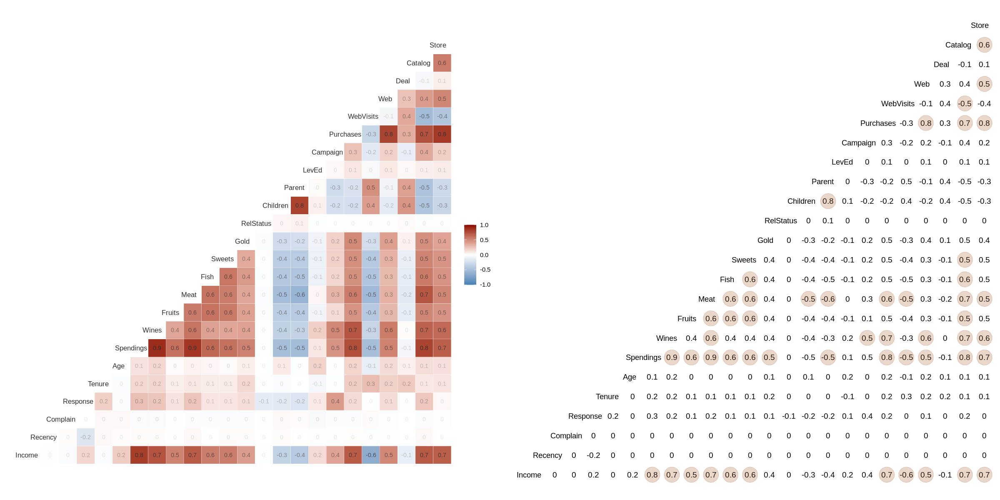

In [ ]:
# Check correlation between all variables
options(repr.plot.width=20, repr.plot.height=10)
require(gridExtra)

plot1 <- ggcorr(ds, method = c("pairwise", "pearson"),hjust = 0.75, size = 3.5, color = "#302e2e", layout.exp = 1, geom = "tile", low = "steelblue", mid = "white", high = "darkred", label = TRUE, label_size = 3, label_color = "#302e2e", label_alpha = TRUE)
# compare with other methods: c("complete", "pearson"),c("complete", "kendall"), c("all.obs", "spearman")
plot2 <- ggcorr(ds, method = c("pairwise", "pearson"),hjust = 0.75, label = TRUE, hjust = 0.75, geom = "blank", layout.exp = 1) + geom_point(size = 10, aes(color = coefficient > 0, alpha = abs(coefficient) > 0.5), color = "#a86232") +
  scale_alpha_manual(values = c("TRUE" = 0.25, "FALSE" = 0)) +
  guides(color = FALSE, alpha = FALSE)
grid.arrange(plot1, plot2, ncol=2, nrow=1)

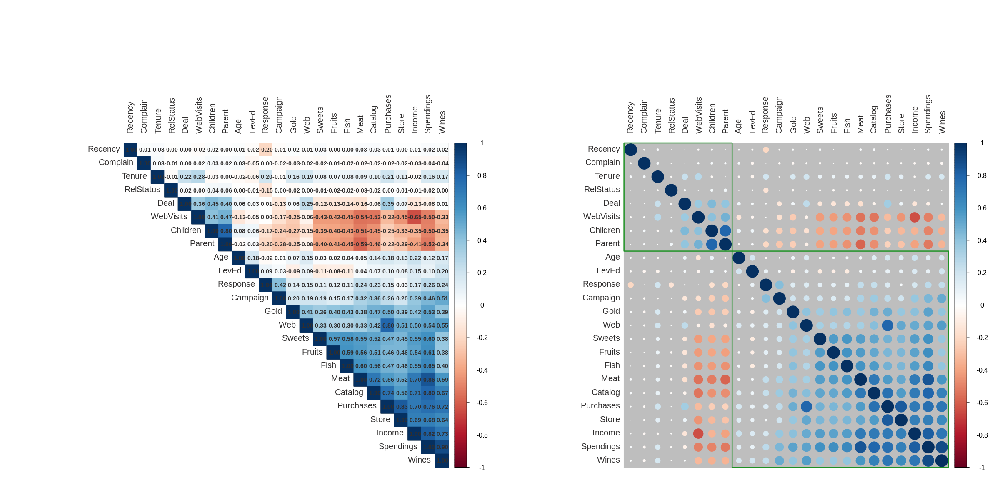

In [ ]:
options(repr.plot.width=20, repr.plot.height=10)
par(mfrow = c(1, 2))
plot3 <- corrplot(corr = cor(ds_num),method="color",order="hclust", tl.col = "#302e2e", type="upper",addCoef.col="#302e2e", number.cex=.7,number.digits=2,diag=TRUE, bg="#302e2e")
plot4 <- corrplot(cor(ds_num),type="full", tl.col = "#302e2e", order="hclust",number.digits=1,diag=TRUE, bg="grey",addrect=2, rect.col="#1c9123")

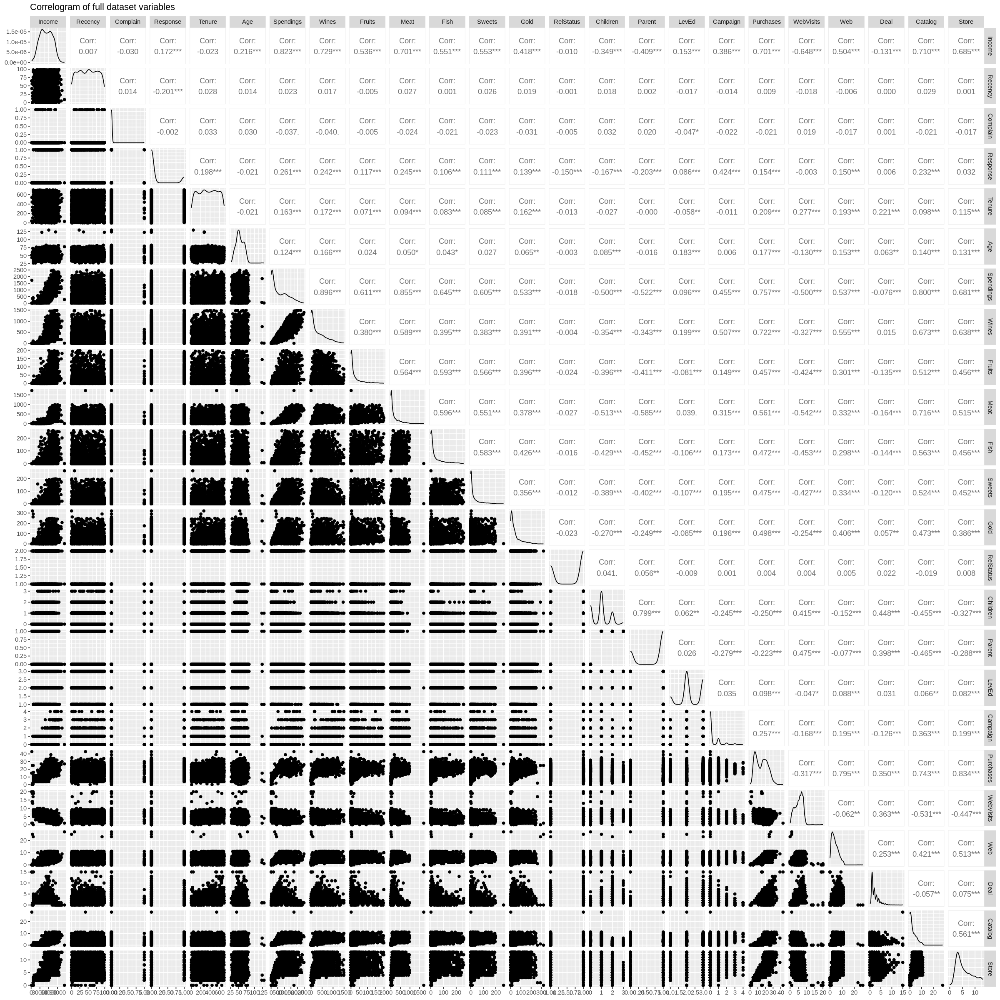

In [ ]:
# Check correlations (as scatterplots), distribution and print correlation coefficient
options(repr.plot.width=20, repr.plot.height=20)
ggpairs(ds_num, title="Correlogram of full dataset variables")

In [ ]:
# Highly correlated variables table format
df_corr = cor(ds_num, use = "pairwise.complete.obs")
hc = findCorrelation(df_corr, cutoff=0.7)
hc = sort(hc)
ds_num_mod = as.data.frame(ds_num)[,-c(hc)]
df_corr2 <- df_corr %>%
  as.data.frame() %>%
  mutate(var1 = rownames(.)) %>%
  gather(var2, value, -var1) %>%
  arrange(desc(value)) %>%
  group_by(value)

corr_tb <- setDT(df_corr2)[abs(value) > 0.7 & var1 != var2 & var1 != "Ttl_Rating"  & var2 != "Ttl_Rating"]
corr_tb <- corr_tb[!duplicated(corr_tb$value),]

l1 <- corr_tb$var1
l2 <- corr_tb$var2

corr_tb[sample(1:nrow(corr_tb), size = nrow(corr_tb)),] %>%
  datatable(filter = 'top', options = list(
    pageLength = 5, autoWidth = T
  ))

HTML widgets cannot be represented in plain text (need html)

# 3. Tối ưu hóa dữ liệu bằng Principal Components Analysis(PCA)

Phương pháp giảm chiều dữ liệu

  Trong bài toán phân cụm như K-Means, DBSCAN, Agglomerative Clustering,...:

  Dữ liệu nhiều chiều (nhiều cột) sẽ khiến việc phân cụm khó và nhiễu.

      PCA giúp:

      Giảm chiều mà vẫn giữ phần lớn thông tin.

      Trực quan hóa dữ liệu bằng 2D hoặc 3D.

      Tăng hiệu quả phân cụm khi loại bỏ các chiều ít ý nghĩa (nhiễu).

In [ ]:
# Check PCA eligibility
# cor(ds_num)
mean(cor(ds_num))

[1] 0.1596167

In [ ]:
# Principal Component Analysis
PCA <- prcomp(ds_num, centre=TRUE, scale=TRUE)

In [ ]:
summary(PCA)

Importance of components:
                          PC1    PC2     PC3     PC4     PC5     PC6     PC7
Standard deviation     2.8986 1.5644 1.24473 1.21755 1.01787 1.01612 0.99764
Proportion of Variance 0.3501 0.1020 0.06456 0.06177 0.04317 0.04302 0.04147
Cumulative Proportion  0.3501 0.4521 0.51660 0.57837 0.62154 0.66456 0.70603
                           PC8     PC9   PC10    PC11    PC12    PC13    PC14
Standard deviation     0.95192 0.91013 0.8612 0.80122 0.75608 0.75465 0.68095
Proportion of Variance 0.03776 0.03451 0.0309 0.02675 0.02382 0.02373 0.01932
Cumulative Proportion  0.74379 0.77830 0.8092 0.83595 0.85977 0.88350 0.90282
                          PC15    PC16    PC17    PC18    PC19    PC20    PC21
Standard deviation     0.65474 0.64397 0.61748 0.54796 0.53072 0.47294 0.41226
Proportion of Variance 0.01786 0.01728 0.01589 0.01251 0.01174 0.00932 0.00708
Cumulative Proportion  0.92068 0.93796 0.95385 0.96636 0.97810 0.98742 0.99450
                         PC22      PC2

Có 7 thành phần chính đầu tiên giúp giữ lại 70% thông tin của dữ liệu gốc.

Có 10 thành phần chính giúp giữ lại 80% thông tin.

Có 14 thành phần chính giúp giữ lại 90% thông tin.

Có 22 thành phần chính là đủ để giữ lại toàn bộ (100%) thông tin của dữ liệu ban đầu.

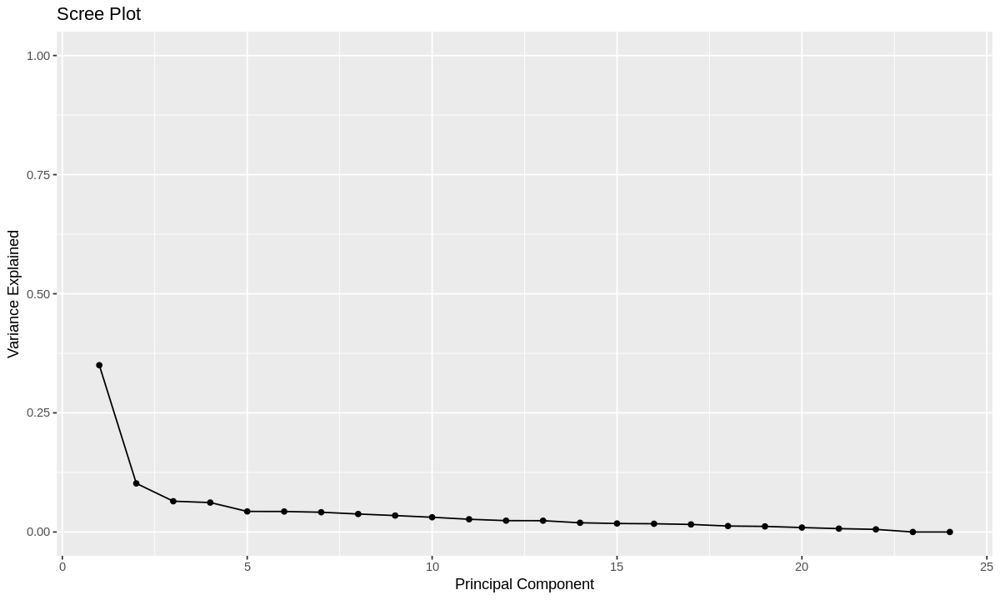

In [ ]:
# Total Variance explained by each PC
var_explained = PCA$sdev^2 / sum(PCA$sdev^2)

# Scree plot
options(repr.plot.width=10, repr.plot.height=6)
qplot(c(1:24), var_explained) +
  geom_line() +
  xlab("Principal Component") +
  ylab("Variance Explained") +
  ggtitle("Scree Plot") +
  ylim(0, 1)

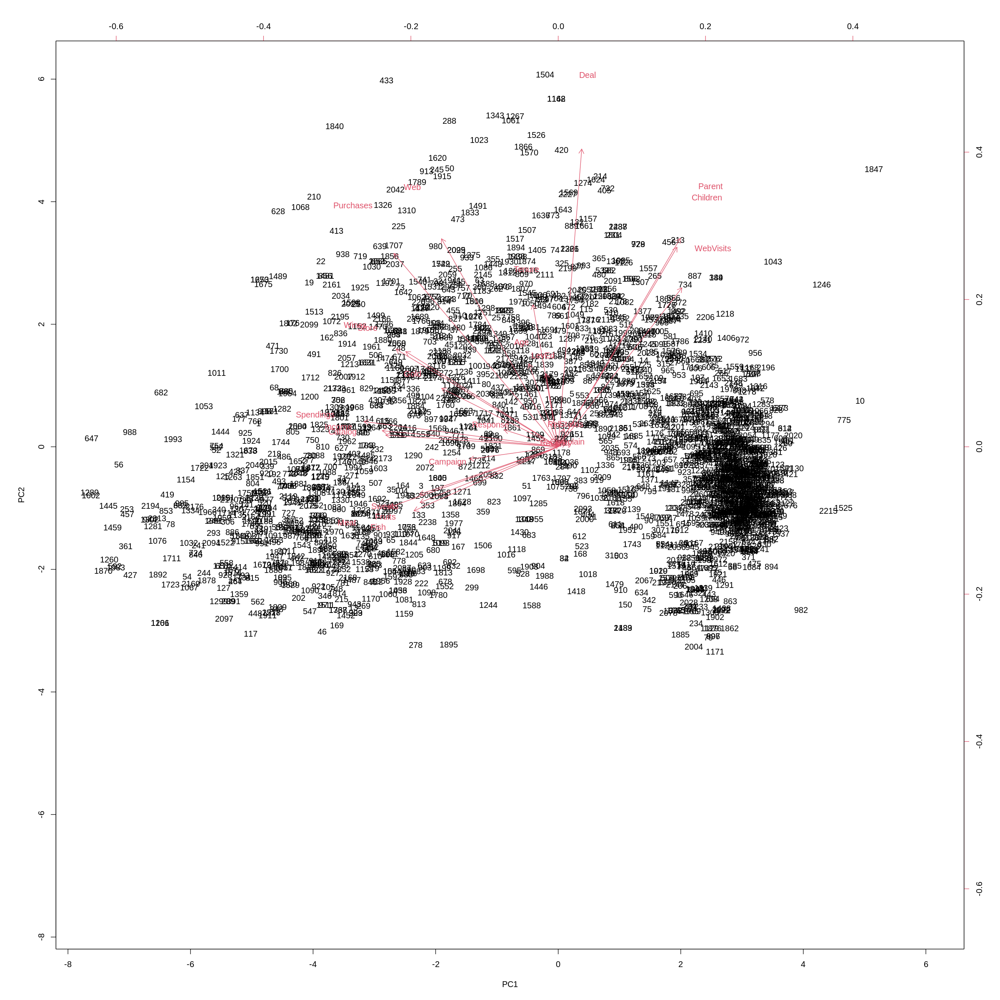

In [ ]:
options(repr.plot.width=20, repr.plot.height=20)
# Defaylt biplot
biplot(PCA, scale=0)

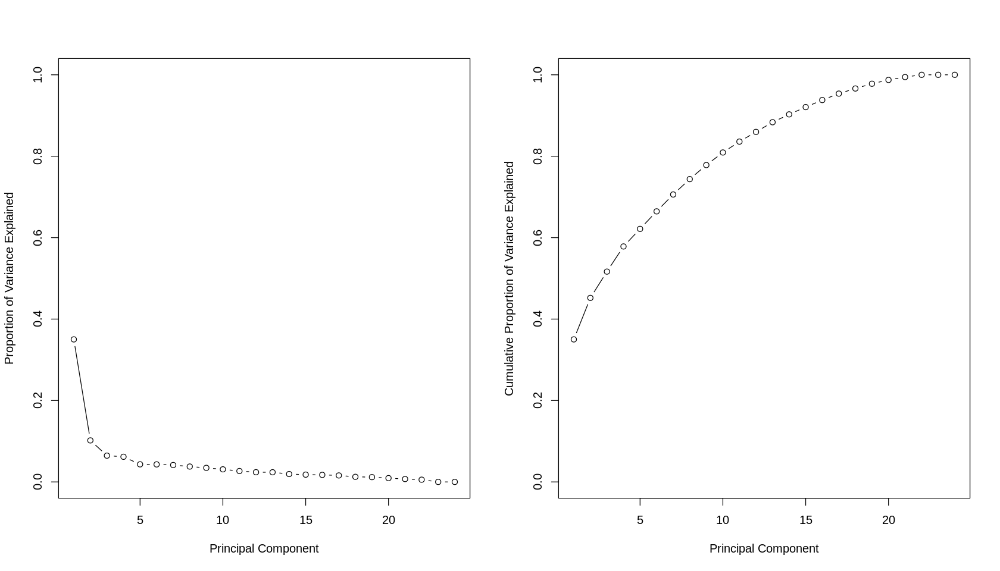

In [ ]:
# Proportion of variance explained (PVE)
pr.var <- PCA$sdev^2

pve=pr.var/sum(pr.var)

# plot the PVE explained by each component, as well as the cumulative PVE
options(repr.plot.width=14, repr.plot.height=8)
par(mfrow = c(1, 2))
plot(pve,
xlab="Principal Component",
ylab="Proportion of Variance Explained",
ylim=c(0,1),
type='b')

plot(cumsum(pve),
xlab="Principal Component",
ylab="Cumulative Proportion of Variance Explained",
ylim=c(0,1),
type='b')

In [ ]:
# Obtain principal components
PC <- PCA$x
PC1 <- PC[, 1]
PC2 <- PC[, 2]
PC3 <- PC[, 3]

# Print first few rows of scores
head(PC)

# Calculate correlation matrix
cor(PC)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24
1,-4.8907221,0.3853274,1.8232724,-1.9283035,-1.6273546,0.3145069,1.1332334,1.1350054,-1.2637709,-0.83893522,⋯,0.03913110,-1.65240070,-0.06170558,0.77486023,-0.76383550,-0.26480420,-0.2673983,0.187150031,-4.626893e-16,1.149119e-15
2,2.9389064,-0.6272841,-0.5797355,1.1488913,-1.0712033,1.1635692,0.6265264,-0.9155272,-1.0748996,-0.04729518,⋯,0.04578311,-0.26711919,0.27543601,-0.01858458,0.08019989,-0.11625419,-0.3243860,-0.008634365,9.475618e-17,-6.845133e-17
3,-2.2414956,-0.6378221,-0.8335939,-0.1954808,0.5613128,0.6717515,-0.5610769,1.1066463,0.3668686,1.52579628,⋯,-0.60524680,-0.13127720,-1.21478567,-0.25147540,0.52833228,-0.34796768,-0.5686395,-0.045491111,-2.476465e-16,5.829840e-16
4,2.8872214,-0.9790229,-0.1605194,-0.2458173,1.1801463,0.5649186,-0.6144904,-0.3718989,0.7955204,0.14067164,⋯,-0.03773059,-0.07087789,-0.08856706,-0.06762193,-0.26408716,0.03459338,0.3811832,0.153965148,-2.961558e-16,-1.276371e-16
5,0.2240211,0.8654055,-1.3891117,0.2697488,0.6151168,-0.9291208,0.2887257,-0.5291260,1.2438134,-1.06857988,⋯,-0.24201692,0.19243038,-0.27695138,0.39560480,0.16541093,-0.24773199,0.1747757,-0.559477960,-1.185621e-16,2.053228e-16
6,-0.7885825,1.2184464,-0.6751909,1.1080081,0.7752160,0.8315055,-0.5750493,0.7469566,1.1108566,0.10331146,⋯,-0.19352653,0.30703124,0.46222112,0.38106418,-0.77648627,0.19266752,-0.1644699,-0.113234662,-3.586688e-16,-4.162167e-16


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24
PC1,1.000000e+00,1.679347e-14,2.695948e-16,-7.084323e-17,-8.510880e-17,-9.731558e-17,8.281633e-17,3.837037e-17,6.374981e-17,7.336768e-18,⋯,-3.547208e-16,-3.396143e-18,-4.147339e-16,-1.278058e-15,1.985811e-17,5.929148e-17,8.164143e-16,-1.627746e-16,-0.179146352,-0.22260818
PC2,1.679347e-14,1.000000e+00,2.766647e-16,-1.263269e-16,-7.091150e-17,-2.202838e-16,-5.624531e-17,4.821034e-16,-1.822373e-16,2.013316e-16,⋯,2.634550e-16,-4.480953e-17,1.526384e-17,6.346394e-17,-4.444766e-16,-1.275844e-16,-7.030127e-16,3.434909e-16,0.065235058,-0.28869154
PC3,2.695948e-16,2.766647e-16,1.000000e+00,-1.325506e-15,-6.751287e-17,-5.107086e-16,-1.372294e-16,9.355210e-17,1.556638e-16,-1.999127e-17,⋯,4.195805e-17,4.380477e-16,-1.646116e-17,1.847314e-16,-2.142861e-16,-3.045163e-16,-1.941316e-15,2.126846e-16,-0.070022091,-0.24338394
PC4,-7.084323e-17,-1.263269e-16,-1.325506e-15,1.000000e+00,-2.898808e-16,-4.345708e-15,-1.277412e-16,-3.072903e-16,3.619844e-16,-3.712262e-16,⋯,1.504410e-16,-1.916645e-16,-5.524495e-17,2.092698e-16,1.680315e-16,-2.929121e-16,-1.475408e-15,1.420386e-17,-0.148365494,-0.04926608
PC5,-8.510880e-17,-7.091150e-17,-6.751287e-17,-2.898808e-16,1.000000e+00,-1.319438e-16,-8.513664e-16,-2.933295e-18,3.426433e-16,5.688810e-16,⋯,-1.594973e-16,9.113468e-17,8.853643e-17,5.046008e-17,-1.605309e-16,6.688691e-17,3.450280e-16,6.433740e-17,-0.406443412,-0.08069211
PC6,-9.731558e-17,-2.202838e-16,-5.107086e-16,-4.345708e-15,-1.319438e-16,1.000000e+00,5.804410e-17,-8.000991e-16,1.559976e-16,-2.347837e-16,⋯,4.028878e-17,5.624560e-17,-4.507008e-17,-1.648807e-16,1.325813e-16,-1.938726e-16,-4.796824e-16,1.188861e-15,0.155022102,-0.26658015
PC7,8.281633e-17,-5.624531e-17,-1.372294e-16,-1.277412e-16,-8.513664e-16,5.804410e-17,1.000000e+00,-7.706792e-16,1.655300e-16,-2.986222e-16,⋯,2.562143e-16,-5.034395e-17,6.523621e-17,7.791809e-17,3.161939e-17,-4.643166e-16,5.986752e-16,-5.314178e-16,-0.259322565,0.10581827
PC8,3.837037e-17,4.821034e-16,9.355210e-17,-3.072903e-16,-2.933295e-18,-8.000991e-16,-7.706792e-16,1.000000e+00,1.810358e-16,-4.467409e-16,⋯,-1.565794e-16,1.395116e-16,-6.768427e-17,1.725574e-17,-1.253850e-16,-2.265233e-16,-4.547604e-16,-7.053402e-16,-0.118950405,0.13301371
PC9,6.374981e-17,-1.822373e-16,1.556638e-16,3.619844e-16,3.426433e-16,1.559976e-16,1.655300e-16,1.810358e-16,1.000000e+00,-1.492927e-15,⋯,-2.905457e-16,2.183936e-17,2.634777e-16,-3.700966e-16,2.097695e-16,-3.781368e-16,1.070980e-15,2.006044e-16,0.191628883,-0.36129761
PC10,7.336768e-18,2.013316e-16,-1.999127e-17,-3.712262e-16,5.688810e-16,-2.347837e-16,-2.986222e-16,-4.467409e-16,-1.492927e-15,1.000000e+00,⋯,2.568240e-16,3.492901e-16,-2.552107e-16,-1.922710e-16,4.074337e-17,-9.776209e-17,-8.128858e-16,-3.079185e-16,-0.097019353,-0.21609086


# 4. Mô hình phân tích

## K-Means Clustering

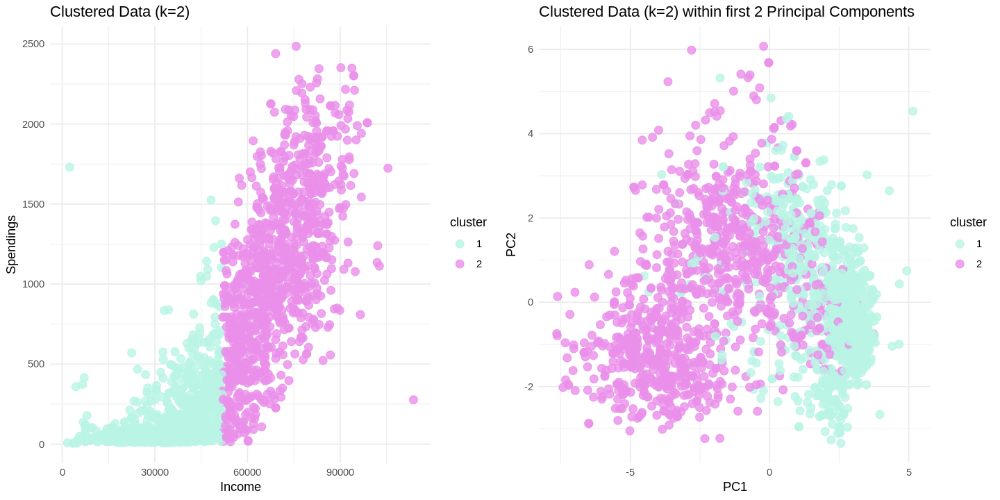

In [ ]:
# Fit k-means clustering with k=2
km_out_2 <- kmeans(ds_num, 2)
# km_out_2

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_2$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6)
require(gridExtra)

ds_num_k2 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=2)", x = "Income", y = "Spendings")

ds_num_k2_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=2) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k2, ds_num_k2_pc, ncol=2)

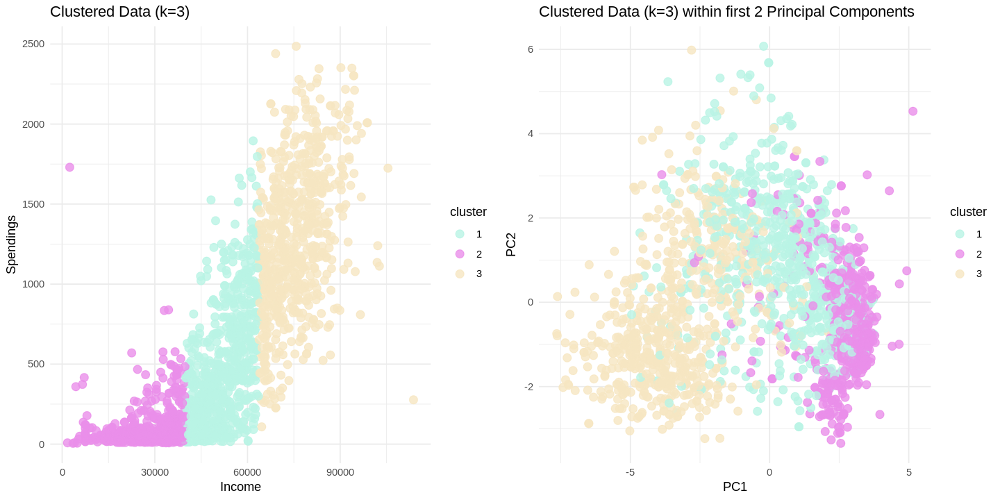

In [ ]:
# Fit k-means clustering with k=3
km_out_3 <- kmeans(ds_num, 3)
# km_out_3

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_3$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6)
require(gridExtra)

ds_num_k3 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=3)", x = "Income", y = "Spendings")

ds_num_k3_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=3) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k3, ds_num_k3_pc, ncol=2)

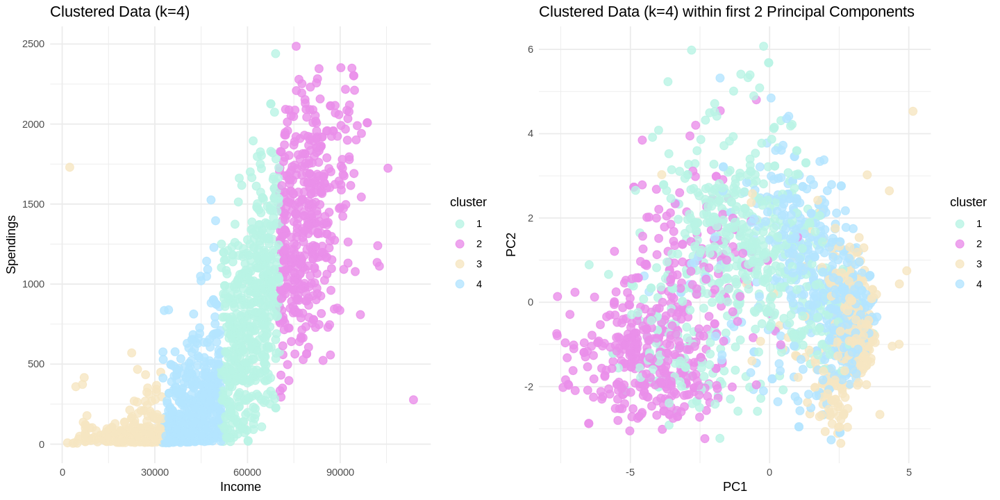

In [ ]:
# Fit k-means clustering with k=4
km_out_4 <- kmeans(ds_num, 4)
# km_out_4

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_4$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6)
require(gridExtra)

ds_num_k4 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2","#B4E4FF")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=4)", x = "Income", y = "Spendings")

ds_num_k4_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2","#B4E4FF")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=4) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k4, ds_num_k4_pc, ncol=2)

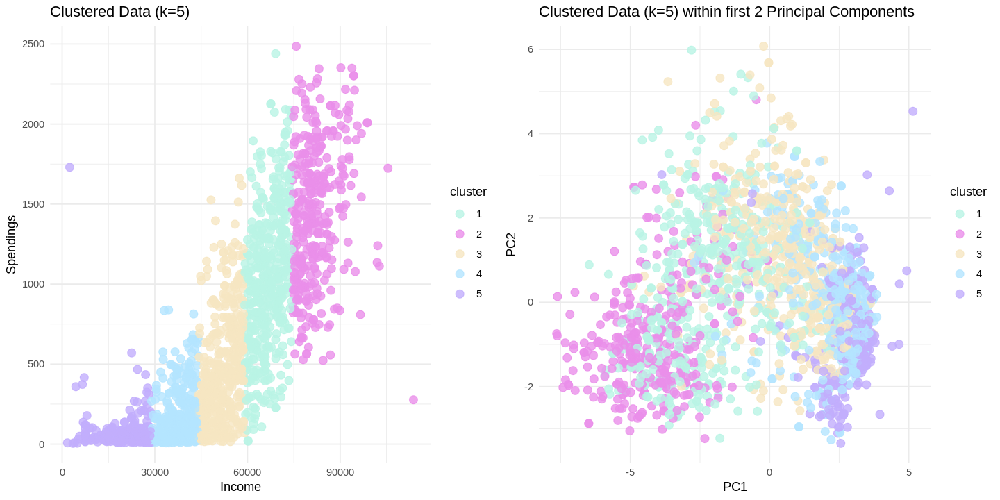

In [ ]:
# Fit k-means clustering with k=5
km_out_5 <- kmeans(ds_num, 5)
# km_out_5

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_5$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6)
require(gridExtra)

ds_num_k5 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2","#B4E4FF", "#C1AEFC")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=5)", x = "Income", y = "Spendings")

ds_num_k5_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2","#B4E4FF", "#C1AEFC")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=5) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k5, ds_num_k5_pc, ncol=2)

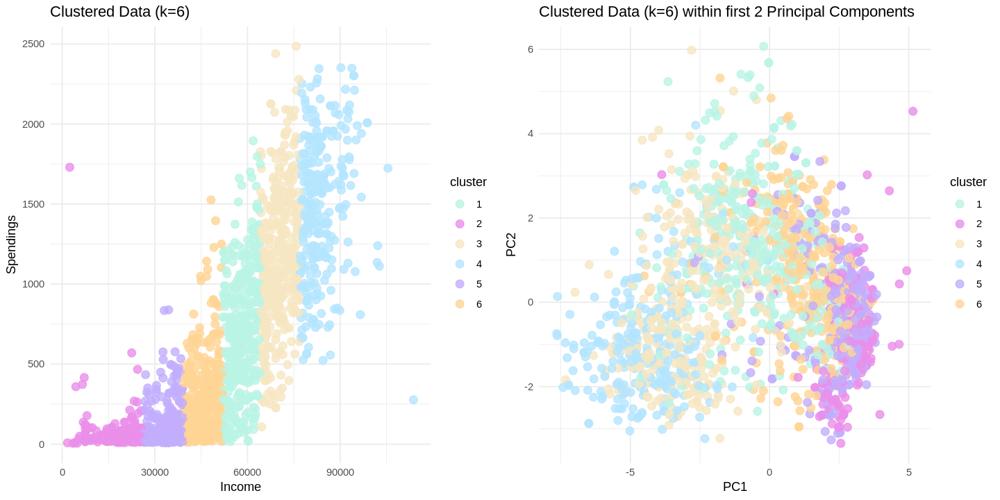

In [ ]:
# Fit k-means clustering with k=6
km_out_6 <- kmeans(ds_num, 6)
# km_out_6

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_6$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6)
require(gridExtra)

ds_num_k6 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2", "#B4E4FF", "#C1AEFC", "#FFD495")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=6)", x = "Income", y = "Spendings")

ds_num_k6_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2", "#B4E4FF", "#C1AEFC", "#FFD495")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=6) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k6, ds_num_k6_pc, ncol=2)

#### WSS (Within-cluster Sum of Squares)   

not having too many clusters (which can lead to overfitting).

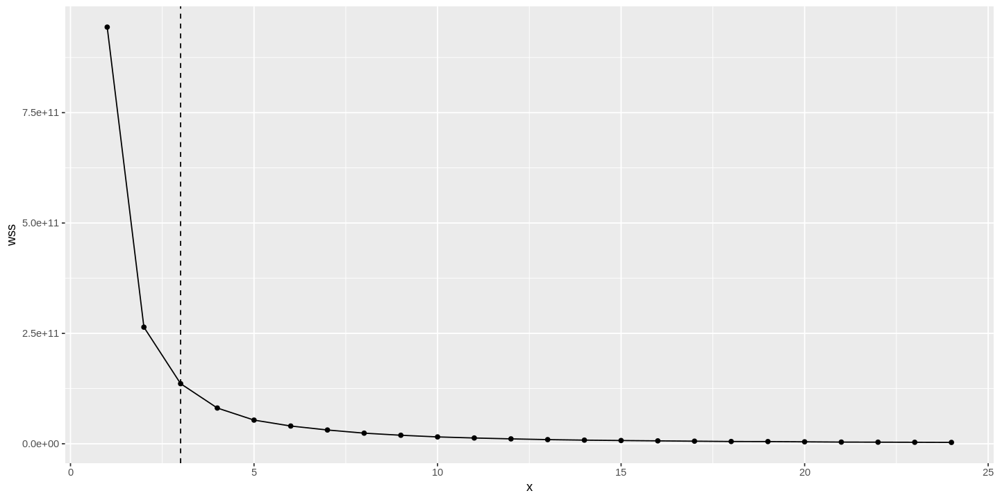

In [ ]:
# Compute WSS for various values of k
wss <- sapply(1:24, function(k){kmeans(ds_num, k, nstart=10 )$tot.withinss})

# Plot the wss for each value of k
ggplot(data.frame(x=1:24, wss=wss), aes(x=x, y=wss)) +
  geom_point() +
  geom_line() +
  geom_vline(xintercept=3, linetype=2)


In [ ]:
# Cluster assignments for k=3 model
km_out_3
options(repr.plot.width=20, repr.plot.height=20)

# Assign cluster labels based on cluster assignments
cluster_labels <- ifelse(km_out_3$cluster == 1, "Cluster 1",
                         ifelse(km_out_3$cluster == 2, "Cluster 2", "Cluster 3"))

# Plot the data with colored clusters and cluster labels
cluster_colors <- c("#B9F3E4", "#EA8FEA", "#F6E6C2")
plot(ds_num,col=cluster_colors[km_out_3$cluster],cex=0.5,pch=1,lwd=2)
text(ds_num, labels = cluster_labels, col = km_out_3$cluster)

## Hierarchical clustering(HC)

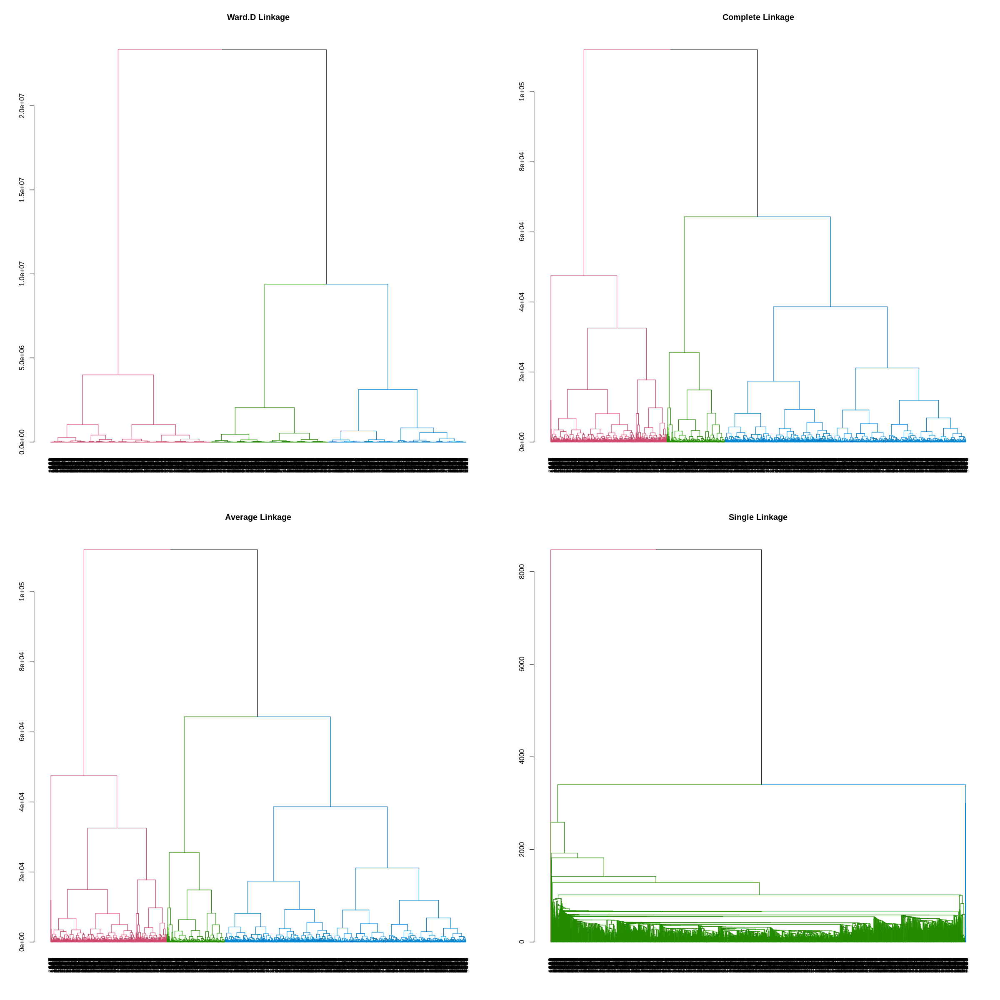

In [ ]:
Hierarchical_Cluster_distances <- dist(ds_num, method="euclidean")

# Ward.D Method
Hierarchical_Cluster <- hclust(Hierarchical_Cluster_distances, method="ward.D")

# Complete Method
Hierarchical_Cluster_Complete <- hclust(Hierarchical_Cluster_distances, method="complete")

# Average Method
Hierarchical_Cluster_Average <- hclust(Hierarchical_Cluster_distances, method="average")

# Single Method
Hierarchical_Cluster_Single <- hclust(Hierarchical_Cluster_distances, method="single")

options(repr.plot.width=20, repr.plot.height=20)
par(mfrow=c(2,2))
as.dendrogram(Hierarchical_Cluster) %>% color_branches(k=3) %>% plot(horiz=FALSE, main = "Ward.D Linkage")
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=3) %>% plot(horiz=FALSE, main = "Complete Linkage")
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=3) %>% plot(horiz=FALSE, main = "Average Linkage")
as.dendrogram(Hierarchical_Cluster_Single) %>% color_branches(k=3) %>% plot(horiz=FALSE, main = "Single Linkage")

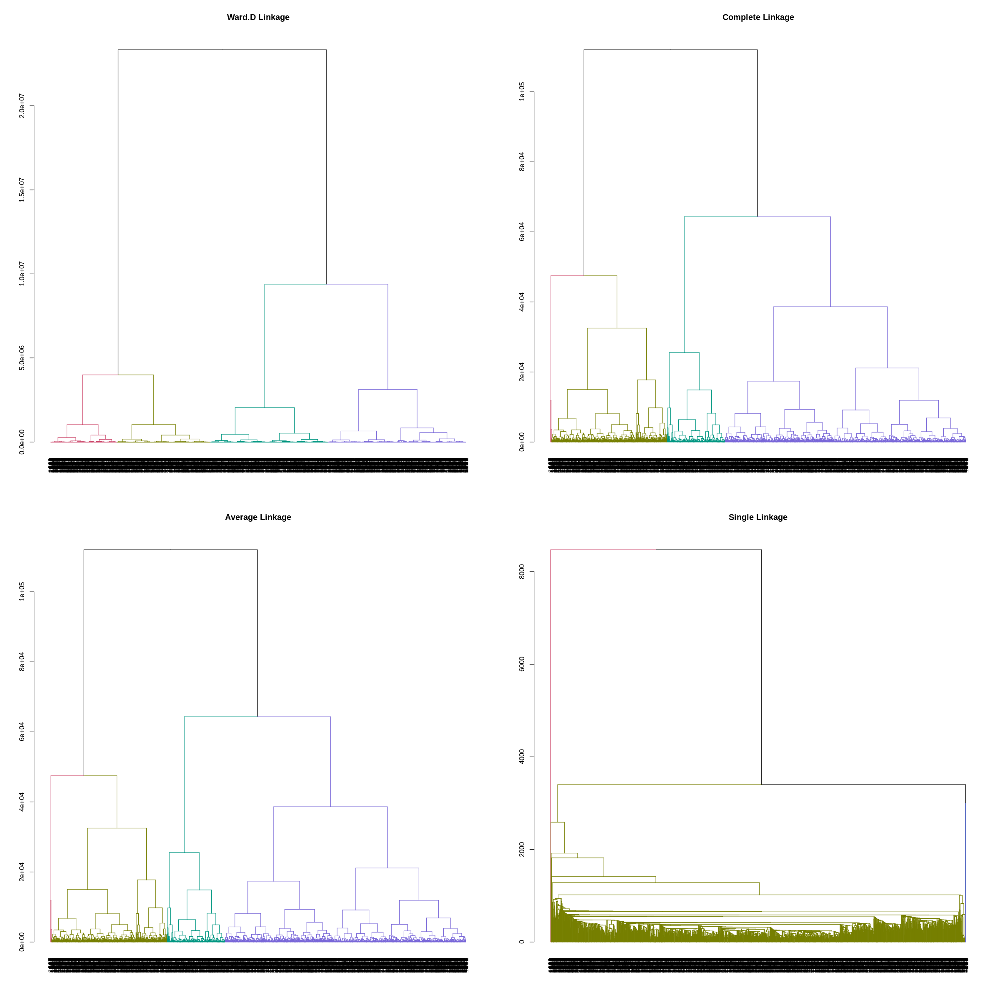

In [ ]:
options(repr.plot.width=20, repr.plot.height=20)
par(mfrow=c(2,2))
as.dendrogram(Hierarchical_Cluster) %>% color_branches(k=4) %>% plot(horiz=FALSE, main = "Ward.D Linkage")
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=4) %>% plot(horiz=FALSE, main = "Complete Linkage")
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=4) %>% plot(horiz=FALSE, main = "Average Linkage")
as.dendrogram(Hierarchical_Cluster_Single) %>% color_branches(k=4) %>% plot(horiz=FALSE, main = "Single Linkage")

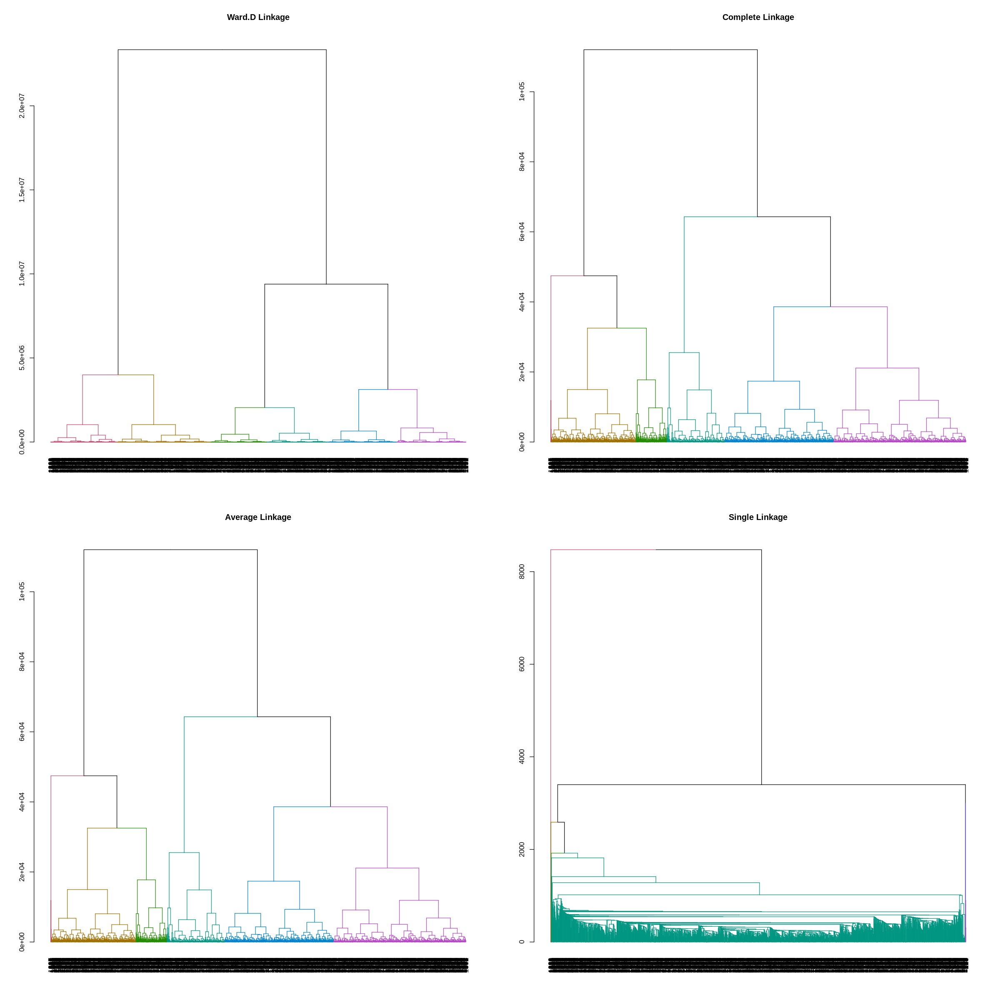

In [ ]:
options(repr.plot.width=20, repr.plot.height=20)
par(mfrow=c(2,2))
as.dendrogram(Hierarchical_Cluster) %>% color_branches(k=6) %>% plot(horiz=FALSE, main = "Ward.D Linkage")
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=6) %>% plot(horiz=FALSE, main = "Complete Linkage")
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=6) %>% plot(horiz=FALSE, main = "Average Linkage")
as.dendrogram(Hierarchical_Cluster_Single) %>% color_branches(k=6) %>% plot(horiz=FALSE, main = "Single Linkage")

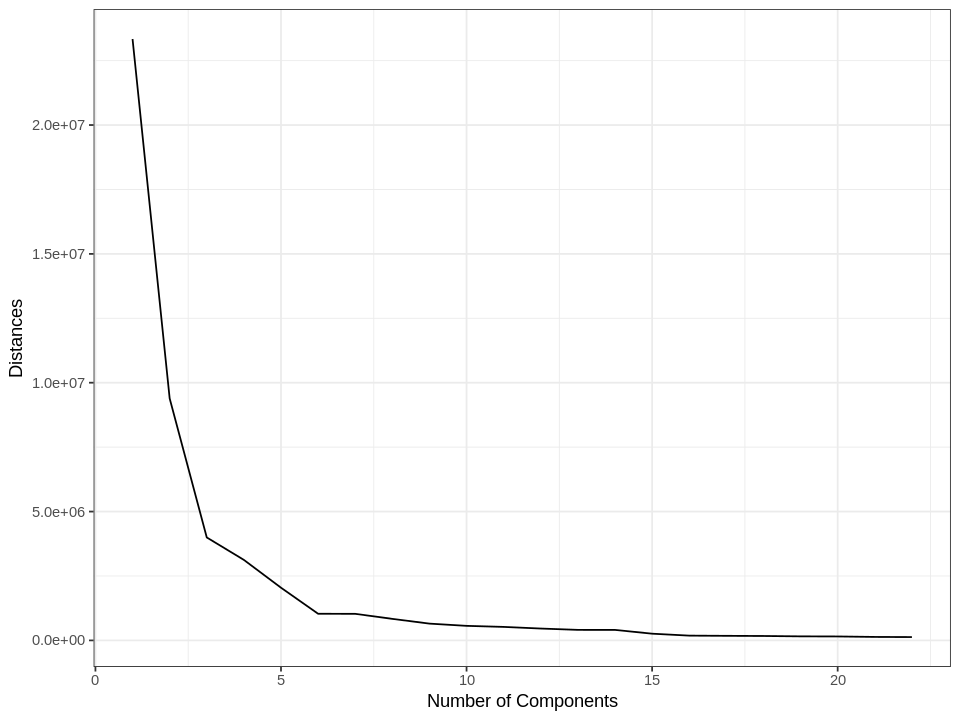

In [ ]:
num <- nrow(ds_num) - 1
df1 <- cbind(as.data.frame(Hierarchical_Cluster$height[length(Hierarchical_Cluster$height):1]), c(1:num))
colnames(df1) <- c("distances","index")
options(repr.plot.width=8, repr.plot.height=6)
ggplot(df1[c(1:22),], aes(x=index, y=distances)) + geom_line() + xlab("Number of Components") +ylab("Distances") + theme_bw()

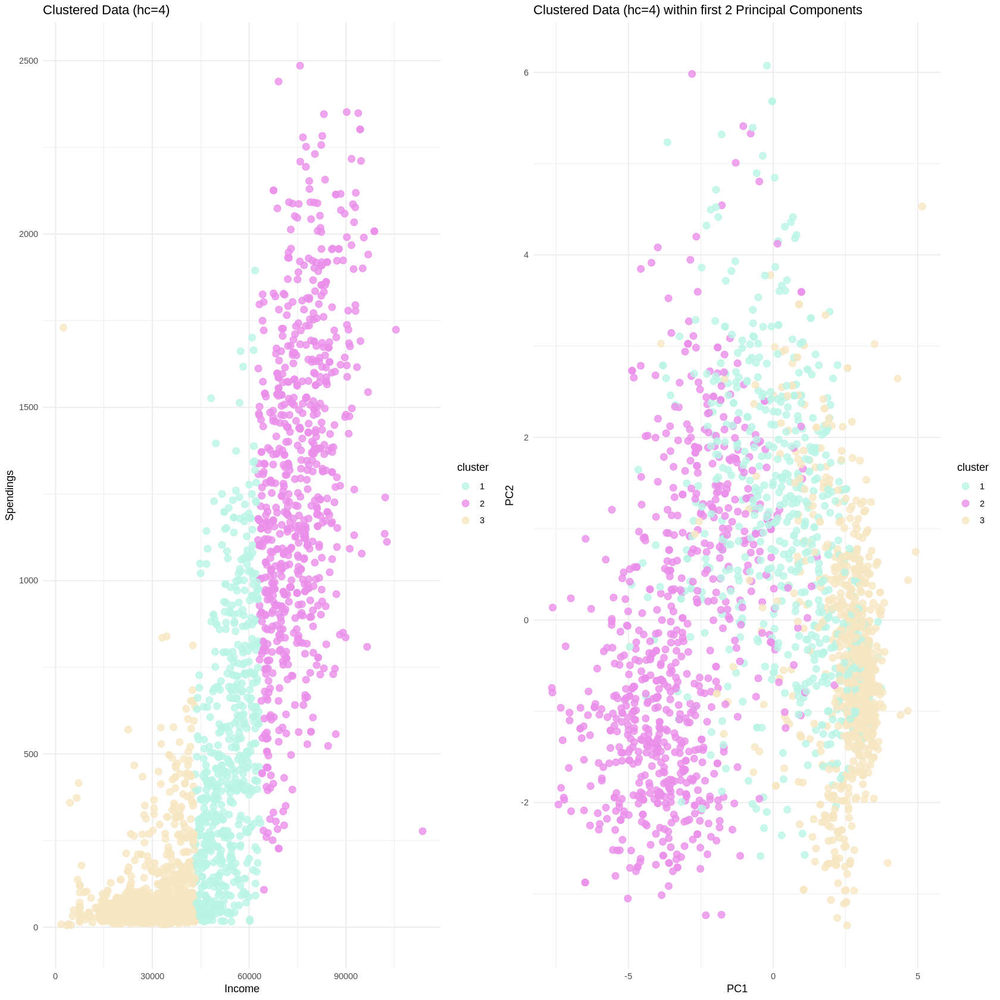

In [ ]:
# Cluster assignment
hc_clusters=cutree(Hierarchical_Cluster, 3)

# Add cluster assignments to original data
ds_num_hc_clustered <- cbind(ds_num, cluster = as.factor(hc_clusters))

# Plot clustered data using ggplot2
options(repr.plot.width=14, repr.plot.height=14)
require(gridExtra)

ds_num_hc3 <- ggplot(ds_num_hc_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2", "#B4E4FF", "#C1AEFC", "#FFD495")) +
  theme_minimal() +
  labs(title = "Clustered Data (hc=4)", x = "Income", y = "Spendings")

ds_num_hc3_pc <- ggplot(ds_num_hc_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2", "#B4E4FF", "#C1AEFC", "#FFD495")) +
  theme_minimal() +
  labs(title = "Clustered Data (hc=4) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_hc3, ds_num_hc3_pc, ncol=2)

In [ ]:
# Cluster assignments for hc=3 model
options(repr.plot.width=20, repr.plot.height=20)

# Assign cluster labels based on cluster assignments
cluster_labels <- ifelse(hc_clusters == 1, "Cluster 1",
                         ifelse(hc_clusters == 2, "Cluster 2", "Cluster 3"))

# Plot the data with colored clusters and cluster labels
cluster_colors <- c("#B9F3E4", "#EA8FEA", "#F6E6C2")
plot(ds_num,col=cluster_colors[hc_clusters],cex=0.5,pch=1,lwd=2)
text(ds_num, labels = cluster_labels, col = hc_clusters)

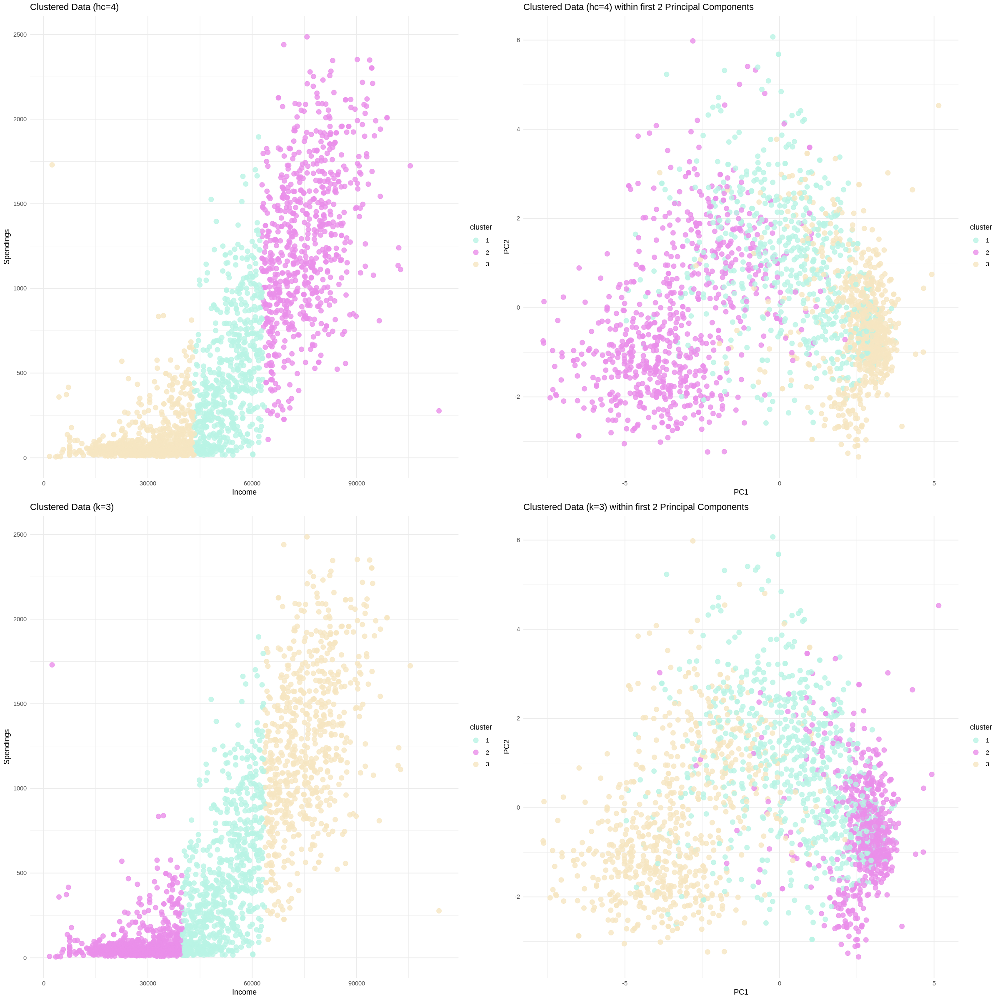

In [ ]:
grid.arrange(ds_num_hc3, ds_num_hc3_pc,ds_num_k3,ds_num_k3_pc, ncol=2)

DBSCAN

In [ ]:
library(dbscan)

# Perform DBSCAN clustering
dbscan_out <- dbscan(ds_num, eps = 0.5, minPts = 5) # Adjust eps and minPts

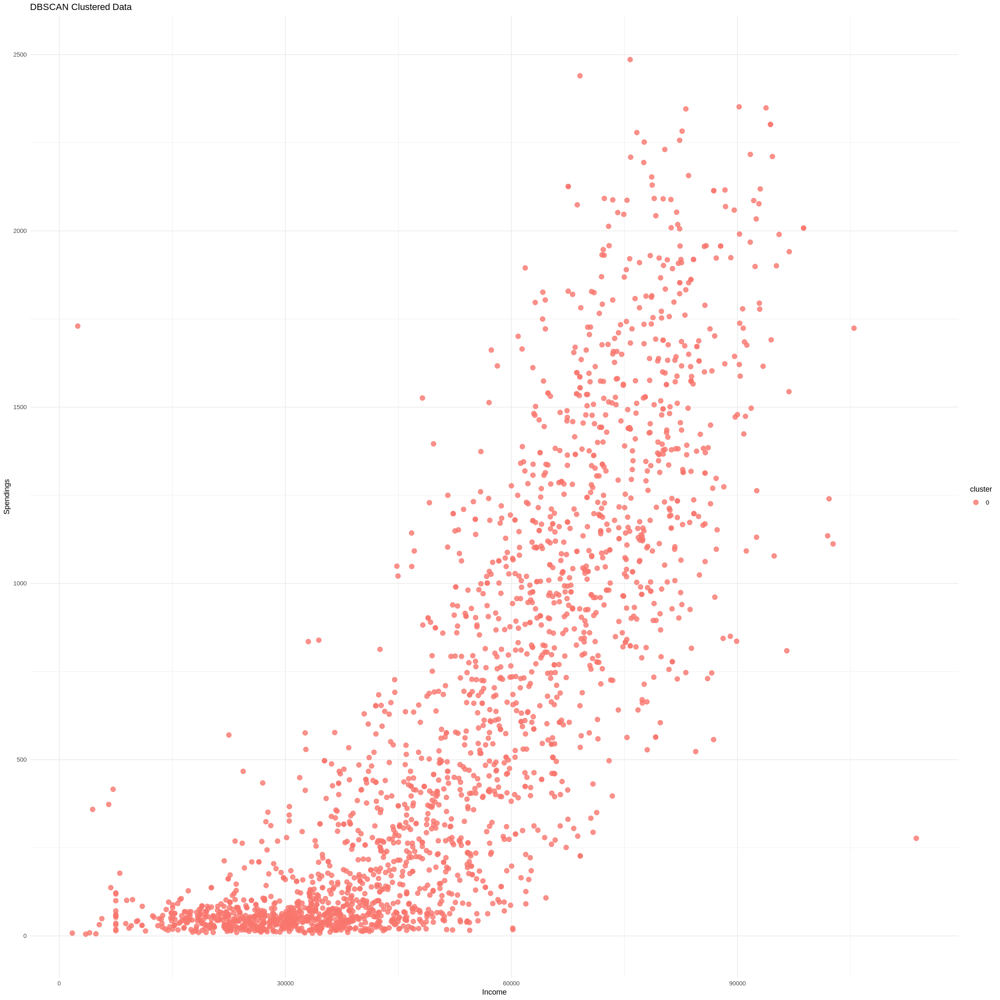

In [ ]:
# Add cluster assignments to your data
ds_num_dbscan_clustered <- cbind(ds_num, cluster = as.factor(dbscan_out$cluster))
# Visualize the results
ggplot(ds_num_dbscan_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  theme_minimal() +
  labs(title = "DBSCAN Clustered Data", x = "Income", y = "Spendings")

# 5.. So sánh đánh giá mô hình

### 5.1. Silhouette Score

Measures how similar a data point is to its own cluster compared to other clusters.

In [ ]:
library(cluster)
    sil_kmeans <- silhouette(km_out_3$cluster, dist(ds_num))
    sil_hierarchical <- silhouette(hc_clusters, dist(ds_num))

    mean(sil_kmeans[, 3]) # Average silhouette score for K-Means
    mean(sil_hierarchical[, 3]) # Average silhouette score for Hierarchical


[1] 0.5477592

[1] 0.5326895

### 5.2. Davies-Bouldin Index

In [ ]:
install.packages("clusterSim")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘pixmap’, ‘sp’, ‘RcppArmadillo’, ‘ade4’




In [ ]:
library(clusterSim)

db_kmeans <- index.DB(ds_num, km_out_3$cluster, centrotypes="centroids")$DB
db_hierarchical <- index.DB(ds_num, hc_clusters, centrotypes="centroids")$DB

db_kmeans # Davies-Bouldin index for K-Means
db_hierarchical # Davies-Bouldin index for Hierarchical


Loading required package: MASS


Attaching package: ‘MASS’


The following object is masked from ‘package:plotly’:

    select


The following object is masked from ‘package:dplyr’:

    select




[1] 0.6461274

[1] 0.6417611

### 5.3. Within-cluster Sum of Squares (WSS)

In [ ]:
km_out_3$tot.withinss # WSS for K-Means

[1] 136180552198

### 5.4. Calinski-Harabasz Index:

In [ ]:
install.packages("fpc")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(fpc)

ch_kmeans <- calinhara(ds_num, km_out_3$cluster)
ch_hierarchical <- calinhara(ds_num, hc_clusters)

ch_kmeans # Calinski-Harabasz index for K-Means
ch_hierarchical # Calinski-Harabasz index for Hierarchical

[1] 6529.534

[1] 6224.241

#  KẾT LUẬN - Comparing the Models

In [ ]:
# Print the metric values for comparison
cat("K-Means:\n")
cat("Silhouette Score:", mean(sil_kmeans[, 3]), "\n")
cat("Davies-Bouldin Index:", db_kmeans, "\n")
cat("WSS:", km_out_3$tot.withinss, "\n")
cat("Calinski-Harabasz Index:", ch_kmeans, "\n\n")

cat("Hierarchical:\n")
cat("Silhouette Score:", mean(sil_hierarchical[, 3]), "\n")
cat("Davies-Bouldin Index:", db_hierarchical, "\n")
cat("Calinski-Harabasz Index:", ch_hierarchical, "\n")

K-Means:
Silhouette Score: 0.5477592 
Davies-Bouldin Index: 0.6461274 
WSS: 136180552198 
Calinski-Harabasz Index: 6529.534 

Hierarchical:
Silhouette Score: 0.5326895 
Davies-Bouldin Index: 0.6417611 
Calinski-Harabasz Index: 6224.241 


Tóm lại, sự lựa chọn giữa K-Means và HC phụ thuộc vào bản chất của dữ liệu, câu hỏi nghiên cứu và tài nguyên tính toán có sẵn. K-MEAN có thể phù hợp hơn với các bộ dữ liệu lớn và số lượng cụm cố định, trong khi phân cụm phân cấp có thể phù hợp hơn với các bộ dữ liệu nhỏ hơn và khám phá các mối quan hệ phân cấp giữa các cụm.

Trong trường hợp của chúng tôi, HC sẽ phù hợp hơn vì bộ dữ liệu chứa hỗn hợp các loại dữ liệu, ngay cả khi có thể không hiệu quả về mặt tính toán khi số lượng quan sát tăng lên.

Ngoài ra, HC có thể dễ hiểu hơn vì dendrogram cung cấp một biểu diễn đồ họa của quá trình phân cụm và các mối quan hệ phân cấp giữa các cụm. K-Means, mặt khác, cung cấp ít cái nhìn sâu sắc hơn về cấu trúc của dữ liệu và các mối quan hệ giữa các cụm.